# **Notebook para o estudo de *machine* *learning* e *data* *fusion***

In [1]:
# instalando as bibliotecas necessárias

#!pip install numpy==1.24.3
#!pip install pandas
#!pip install plotly
#!pip install chemotools
#!pip install scipy
#!pip install scikit-learn
#!pip install kennard-stone

In [ ]:
!git clone https://github.com/joseviniciusr/aula-ML-e-DF.git

import os

# Muda o diretório atual para o repositório clonado
os.chdir("/content/aula-ML-e-DF")

# Verifica se mudou
print("Diretório atual:", os.getcwd())

In [3]:
#vamos começar importando os dados
import pandas as pd

dados = pd.read_csv('Toledo_dataset.csv', sep=';')

In [4]:
XRF = dados.loc[:, '1':'15'] #selecionando as colunas de interesse XRF
vis = dados.loc[:, '400':'700'] # vis
NIR = dados.loc[:, '1351.542978':'2150.472084'] #NIR
y = dados['exMg'] # selecionando a coluna SOC

In [5]:
#para uma visualização rápida, vamos usar o .plot do pandas, com a interface do plotly
pd.options.plotting.backend = 'plotly'
XRF.T.plot(kind='line')

In [6]:
vis.T.plot(kind='line') #plot rapido nir

In [7]:
NIR.T.plot(kind='line') #plot rapido nir

In [8]:
y.T.plot(kind='line') #plot rapido nir

## **Splitting treino e validação**

In [9]:
dadosks = pd.concat([y, XRF, vis, NIR], axis=1) # o axis=1 é para concatenar colunas (se fosse axis=0, concatenaria linhas)

In [10]:
import kennard_stone as ks
dadoscal, dadosval = ks.train_test_split(dadosks, test_size=0.3)

dadoscal = dadoscal.reset_index(drop=True) #resetando os indices
dadosval = dadosval.reset_index(drop=True)

C:\Users\Usuario\AppData\Roaming\Python\Python313\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

2025-09-30 14:29:10,165 - kennard_stone.utils._pairwise:109[INFO] - Calculating pairwise distances using scikit-learn.

C:\Users\Usuario\AppData\Roaming\Python\Python313\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

2025-09-30 14:29:10,172 - kennard_stone.utils._pairwise:109[INFO] - Calculating pairwise distances using scikit-learn.

C:\Users\Usuario\AppData\Roaming\Python\Python313\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



In [11]:
XRFcal = dadoscal.loc[:, '1':'15'] #selecionando as colunas de interesse XRF
viscal = dadoscal.loc[:, '400':'700'] # vis
NIRcal = dadoscal.loc[:, '1351.542978':'2150.472084'] #NIR
ycal = dadoscal[['exMg']] # selecionando a coluna

In [12]:
XRFval = dadosval.loc[:, '1':'15'] #selecionando as colunas de interesse XRF
visval = dadosval.loc[:, '400':'700'] # vis
NIRval = dadosval.loc[:, '1351.542978':'2150.472084'] #NIR
yval = dadosval[['exMg']] # selecionando a coluna

# **pre-processamentos**

In [13]:
import preprocessings as prepr #realizando escalonamento de poisson com a biblioteca propria
import numpy as np

XRFcal_prep, XRFmean = prepr.poisson(XRFcal, mc=False)
XRFval_prep = ((XRFval)/np.sqrt(XRFmean))
#XRFcal_prep.T.plot()

In [14]:
from scipy.signal import savgol_filter #SAVGOL

NIRcal_prep = pd.DataFrame(savgol_filter(NIRcal,
                                        window_length=11, # window size
                                        polyorder=1, # polynomial order
                                        deriv=1)) # first derivative

NIRval_prep = pd.DataFrame(savgol_filter(NIRval,
                                        window_length=11,
                                        polyorder=1,
                                        deriv=1))
NIRcal_prep.T.plot()

In [15]:
viscal_prep = pd.DataFrame(savgol_filter(viscal,
                                        window_length=3, # window size
                                        polyorder=1, # polynomial order
                                        deriv=1)) # first derivative

visval_prep = pd.DataFrame(savgol_filter(visval,
                                        window_length=3,
                                        polyorder=1,
                                        deriv=1))
viscal_prep.T.plot()

In [16]:
Xcal_prep = pd.concat([XRFcal_prep, viscal_prep, NIRcal_prep], axis=1) # concatenando os dados preprocessados
Xval_prep = pd.concat([XRFval_prep, visval_prep, NIRval_prep], axis=1)

Xcal_prep, sd_concat, mean_concat = prepr.auto_scaling(Xcal_prep) # autoescalonando os dados
Xval_prep = (Xval_prep / sd_concat) - mean_concat

In [17]:
Xcal_prep.columns = dadoscal.columns[1:] # renomeando as colunas
Xval_prep.columns = dadosval.columns[1:]

# **Random Forest com os dados concatenados - low level fusion approach**

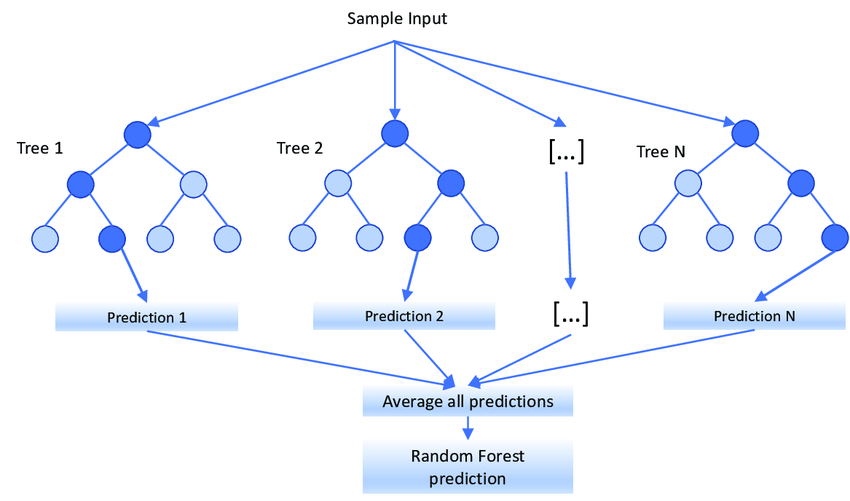

# **Aplicação do algoritmo RandomForest**

**Parâmetros**: <br>
- **criterion** (strg): A função para medir a qualidade de uma divisão. {“squared_error”, “absolute_error”, “friedman_mse”, “poisson”}, padrão=”squared_error” <br>
- **n_estimators** (int): número de árvores na floresta (default = 100)<br>
- **min_samples_split** (int): O número mínimo de amostras necessárias para dividir um nó teste default=2 <br>
- **max_features** (int): número máximo de recursos (**variáveis**) considerados para dividir um nó default=1.0 (todas as features) <br>
- **max_depth** (int/float): número máximo de níveis em cada árvore de decisão default=None <br>
- **min_samples_leaf** (int): O número mínimo de amostras necessárias para estar em um nó folha default=1 <br>
- **min_impurity_decrease** (float): Um nó será dividido se esta divisão induzir uma diminuição da impureza maior ou igual a este valor.<br>
- **random_state**: semente usada para gerar números aleatórios durante a execução (importante para reprodutibilidade)
<br>
Para os outros parametros, ver: <br>
Ver: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html

In [18]:
print(Xcal_prep.shape)
print(ycal.shape)

(110, 1351)
(110, 1)


In [19]:
print(Xval_prep.shape)
print(yval.shape)

(48, 1351)
(48, 1)


In [20]:
#modelando com random forest
from sklearn.ensemble import RandomForestRegressor

# Criando a função classe RandomForestRegressor() com parametros no default
rf = RandomForestRegressor(criterion= 'squared_error',
                                max_features = 200,
                                random_state=1)

# Ajustando o algoritmo a base de dados
rf.fit(Xcal_prep, ycal['exMg'])

# Resultados de calibração e predição por meio do comando predict()
y_cal_res = rf.predict(Xcal_prep)
calres_rf_low = pd.DataFrame({'Ref':ycal['exMg'], 'Predicted':y_cal_res})

In [22]:
def resumo(Ref, Predicted):
    import numpy as np
    from sklearn.metrics import mean_squared_error, r2_score
    from scipy.stats import iqr


    # Calculando R²
    R2 = r2_score(Ref, Predicted)

    # r2
    r2 = (np.corrcoef(Predicted, Ref)[0, 1]) ** 2

    # Calculando RMMSE
    rmse = np.sqrt(mean_squared_error(Ref, Predicted))

    #Calculando rpd
    rpd = np.std(Ref)/rmse

    #Calculando RPIQ
    rpiq = iqr(Ref, rng=(25,75))/rmse

    # Bias
    bias = sum(Ref - Predicted)/Ref.shape[0]
    SDV_pred = (Ref - Predicted) - bias
    SDV_pred = SDV_pred*SDV_pred
    SDV_pred = np.sqrt(sum(SDV_pred)/(Ref.shape[0] - 1))
    tbias = abs(bias)*(np.sqrt(Ref.shape[0])/SDV_pred)

    # Resumo do modelo
    resumo = pd.DataFrame([R2, r2, rmse, rpd, rpiq, bias, tbias]).T
    resumo.columns = ['R2', 'r2', 'RMSE', 'RPD', 'RPIQ', 'bias', 'tbias']
    return resumo

In [23]:
#resumo calibração

resumo_cal_rf_low = resumo(calres_rf_low['Ref'], calres_rf_low['Predicted'])
resumo_cal_rf_low.T

,0
R2,0.927288
r2,0.958110
RMSE,0.326174
RPD,3.708492
RPIQ,5.817453
bias,0.004321
tbias,0.138318


In [24]:
#predição
y_pred_res = rf.predict(Xval_prep)
predres_rf_low = pd.DataFrame({'Ref':yval['exMg'], 'Predicted':y_pred_res})

#aplicando a função resumo
resumo_pred_rf_low = resumo(predres_rf_low['Ref'], predres_rf_low['Predicted'])
resumo_pred_rf_low.T

,0
R2,0.681463
r2,0.733185
RMSE,0.708086
RPD,1.771821
RPIQ,2.513820
bias,0.016092
tbias,0.155839


In [ ]:
resumo_rf_low = pd.concat([resumo_cal_rf_low.T, resumo_pred_rf_low.T], axis=1)
resumo_rf_low.columns = ['Cal', 'Val']
resumo_rf_low

,Calibração,Predição
R2,0.927288,0.681463
r2,0.958110,0.733185
RMSE,0.326174,0.708086
RPD,3.708492,1.771821
RPIQ,5.817453,2.513820
bias,0.004321,0.016092
tbias,0.138318,0.155839


In [26]:
calres_rf_low['set'] = 'cal'
predres_rf_low['set'] = 'pred'
rf_low_results = pd.concat([calres_rf_low, predres_rf_low], axis=0)

import plotly.express as px

fig = px.scatter(rf_low_results,
              x='Ref',
              y='Predicted',
              color='set',
              color_discrete_sequence=['red', 'blue'])
fig.show()

# **Redes Neurais Clássicas com os dados concatenados - low level fusion approach**


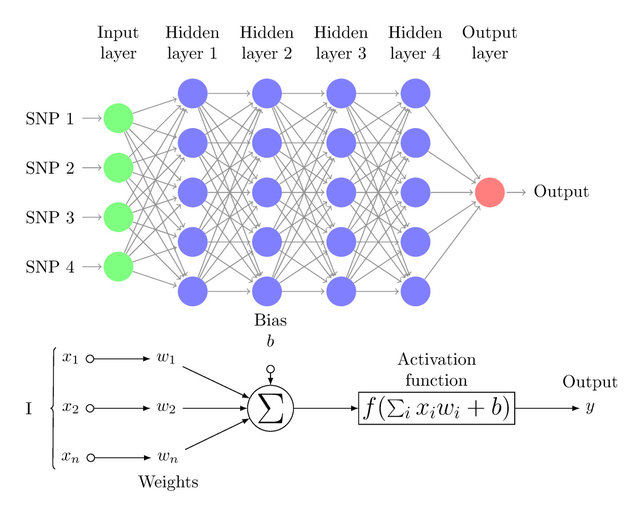

**Parâmetros**: <br>
- **Bias**: Ele é travado como true. O bias (ou viés) em uma rede neural funciona como uma constante adicional que é adicionada ao valor ponderado (produto escalar dos pesos e entradas) antes de aplicar a função de ativação em cada neurônio. Ele permite que o neurônio aprenda uma função que não passa pela origem (ponto zero), o que pode ser crucial para modelar dados onde a relação entre entradas e saídas não começa no zero. Em outras palavras, ele permite que a função de ativação não dependa apenas do produto escalar dos pesos e entradas, dando mais flexibilidade para que ela também seja deslocada para a esquerda ou para a direita. Isso ajuda a rede a se ajustar melhor aos dados de treinamento. <br>
- **hidden_layer_sizes**: camadas ocultas de neuronios artificiais ex: (100, 50, 20). Default (100,) <br>
- **activation**: função de ativação dos neuronios artificiais. 'identify' (nenhuma), 'logistic', 'tanh', 'relu' (default) <br>
- solver: algoritmo para backpropagation. 'sgd' (stochastic gradient descent), 'adam' (sgd otimizado) <br>
- **alpha**: termo de regularização L2. O alpha controla a quantidade de regularização aplicada à função de custo do modelo. Ele é utilizado para previnir overfiting penalizando a função de custo. Ao aumentar o alfa, a penalidade para pesos maiores se torna mais significativa, o que pode levar a um modelo mais simples que generaliza melhor para dados não vistos <br>
- **batch_size** (int): Tamanho dos minilotes para otimizadores estocásticos.  Default é min(200, n_samples) <br>
- **learning_rate**: taxa de aprendizagem. 'constant' (default), 'invscaling', 'adaptive'. 'invscaling' diminui gradualmente a taxa de aprendizagem learning_rate_ em cada passo de tempo 't' usando um expoente de escala inverso de 'power_t'. taxa_de_aprendizagem_efetiva = taxa_de_aprendizado_init / pow(t, potência_t). 'adaptativo' mantém a taxa de aprendizagem constante em 'learning_rate_init' enquanto a perda de treinamento continuar diminuindo. Cada vez que duas épocas consecutivas não conseguem diminuir a perda de treinamento em pelo menos tol, ou não conseguem aumentar a pontuação de validação em pelo menos tol se 'early_stopping' estiver ativado, a taxa de aprendizado atual é dividida por 5. <br>
- **learning_rate_init** (float): taxa de aprendizagem inicial ou constante se 'constant' for utilizado. Default=0.001<br>
- **power_t**: O expoente da taxa de aprendizagem de escala inversa. É usado na atualização da taxa de aprendizagem efetiva quando learning_rate está definido como 'invscaling'. Usado apenas quando solucionador='sgd'. Default=0.5 <br>
- **max_iter**: numero de épocas<br>
- **shuffle**: Se as amostras devem ser embaralhadas em cada iteração. Usado apenas quando solver='sgd' ou 'adam'. Bol, Default=True<br>
- **tol**: Float, Default = 1e-4. Tolerância para a otimização. Quando a perda ou pontuação não melhora pelo menos tol em n_iter_no_change iterações consecutivas, a menos que learning_rateseja definido como 'adaptativo', a convergência é considerada alcançada e o treinamento é interrompido. <br>
- **momentum**: Momentum para atualização de descida gradiente. Deve estar entre 0 e 1. Usado somente quando solver='sgd'. Default=0.9<br>
- **early_stopping**: Bol, Default=False. Se deve-se usar a parada antecipada para encerrar o treinamento quando a pontuação de validação não estiver melhorando. Se definido como True, ele reservará automaticamente a validação_fração dos dados de treinamento como validação e encerrará o treinamento quando a pontuação de validação não estiver melhorando em pelo menos tol por n_iter_no_change épocas consecutivas. Efetivo apenas quando solver=’sgd’ ou ‘adam’. <br>
- **validation_fractio**n. float, Default = 0.1. A proporção de dados de treinamento a serem reservados como conjunto de validação para parada antecipada. Deve estar entre 0 e 1. Usado somente se early_stopping for True. <br>
Tem varios outros parametros: <br>
Ver: https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPRegressor.html

In [27]:
from sklearn.neural_network import MLPRegressor

#rodando o algoritmo
ann = MLPRegressor(hidden_layer_sizes=np.arange(200, 0, -20),
                           activation='relu',
                           solver='adam',
                           learning_rate='adaptive', 
                           max_iter=300, # número máximo de iterações
                           early_stopping=True, # interrompe o treinamento se o erro de validação não diminuir após certo número de iterações
                           tol=1e-3, # tolerância para considerar que o erro não está mais diminuindo
                           n_iter_no_change=50, # número de iterações sem mudança para considerar a parada
                           validation_fraction=0.3, # fração dos dados de validação (similar a CV)
                           batch_size=50, # numero de amostras utilizadas para calcular o gradiente em cada iteração
                           random_state=1)

# Ajustando o algoritmo a base de dados
ann.fit(Xcal_prep, ycal['exMg'])

y_cal_res = ann.predict(Xcal_prep)
calres_ann_low = pd.DataFrame({'Ref':ycal['exMg'], 'Predicted':y_cal_res})
resumo_cal_ann_low = resumo(calres_ann_low['Ref'], calres_ann_low['Predicted'])
resumo_cal_ann_low.T


,0
R2,0.782248
r2,0.783643
RMSE,0.564452
RPD,2.142986
RPIQ,3.361669
bias,-0.006214
tbias,0.114941


In [28]:
# Resultados de predição por meio do comando predict()
y_pred_res = ann.predict(Xval_prep)
predres_ann_low = pd.DataFrame({'Ref':yval['exMg'], 'Predicted':y_pred_res})

resumo_pred_ann_low = resumo(predres_ann_low['Ref'], predres_ann_low['Predicted'])
resumo_pred_ann_low.T

,0
R2,0.714296
r2,0.734563
RMSE,0.670601
RPD,1.870862
RPIQ,2.654337
bias,-0.059647
tbias,0.612204


In [ ]:
resumo_ann_low = pd.concat([resumo_cal_ann_low.T, resumo_pred_ann_low.T], axis=1)
resumo_ann_low.columns = ['Cal', 'Val']
resumo_ann_low

,Calibração,Predição
R2,0.782248,0.714296
r2,0.783643,0.734563
RMSE,0.564452,0.670601
RPD,2.142986,1.870862
RPIQ,3.361669,2.654337
bias,-0.006214,-0.059647
tbias,0.114941,0.612204


In [30]:
calres_ann_low['set'] = 'cal'
predres_ann_low['set'] = 'pred'
ann_low_results = pd.concat([calres_ann_low, predres_ann_low], axis=0)

fig = px.scatter(ann_low_results,
              x='Ref',
              y='Predicted',
              color='set',
              color_discrete_sequence=['red', 'blue'])
fig.show()

# **High level fusion**

- Vamos combinar os modelos random forest individuais por meio de uma regressão

## **RF**

In [31]:
# modelo individual com xrf

rf.fit(XRFcal_prep, ycal['exMg'])
y_cal_res_xrf = rf.predict(XRFcal_prep)
y_val_res_xrf = rf.predict(XRFval_prep)


# modelo individual com nir

rf.fit(NIRcal_prep, ycal['exMg'])
y_cal_res_nir = rf.predict(NIRcal_prep)
y_val_res_nir = rf.predict(NIRval_prep)

# modelo individual com vis

rf.fit(viscal_prep, ycal['exMg'])
y_cal_res_vis = rf.predict(viscal_prep)
y_val_res_vis = rf.predict(visval_prep)


#juntando os resultados dos rf individuais
high_level_cal = pd.DataFrame({'xrf': y_cal_res_xrf,
                               'vis': y_cal_res_vis,
                               'nir': y_cal_res_nir})

high_level_pred = pd.DataFrame({'xrf': y_val_res_xrf,
                                'vis': y_val_res_vis,
                                'nir': y_val_res_nir})

In [32]:
from sklearn.linear_model import LinearRegression

#modelo de regressão com as predições
high_level_model = LinearRegression()
high_level_model.fit(X=high_level_cal, y=ycal)

y_cal_res = high_level_model.predict(high_level_cal) # esse comando gera arrays do numpy 2-dimensionais
calres_high = pd.DataFrame({'Ref':ycal['exMg'], 'Predicted':y_cal_res.ravel()}) #o comando ravel diminui a dimensão do array numpy

resumo_cal_high = resumo(calres_high['Ref'], calres_high['Predicted'])
resumo_cal_high.T

,0
R2,9.753392e-01
r2,9.753392e-01
RMSE,1.899548e-01
RPD,6.367897e+00
RPIQ,9.989220e+00
bias,6.797593e-16
tbias,3.736097e-14


In [33]:
y_pred_res = high_level_model.predict(high_level_pred)
predres_high = pd.DataFrame({'Ref':yval['exMg'], 'Predicted':y_pred_res.ravel()})

resumo_pred_high = resumo(predres_high['Ref'], predres_high['Predicted'])
resumo_pred_high.T

,0
R2,0.610312
r2,0.681324
RMSE,0.783185
RPD,1.601922
RPIQ,2.272772
bias,-0.061673
tbias,0.541544


In [ ]:
resumo_high_level_rf = pd.concat([resumo_cal_high.T, resumo_pred_high.T], axis=1)
resumo_high_level_rf.columns = ['Cal', 'Val']
resumo_high_level_rf

,Calibração,Predição
R2,9.753392e-01,0.610312
r2,9.753392e-01,0.681324
RMSE,1.899548e-01,0.783185
RPD,6.367897e+00,1.601922
RPIQ,9.989220e+00,2.272772
bias,6.797593e-16,-0.061673
tbias,3.736097e-14,0.541544


In [35]:
calres_high['set'] = 'cal'
predres_high['set'] = 'pred'
high_level_results = pd.concat([calres_high, predres_high], axis=0)

import plotly.express as px

fig = px.scatter(high_level_results,
              x='Ref',
              y='Predicted',
              color='set',
              color_discrete_sequence=['red', 'blue'])
fig.show()

## biblioteca **automated_datafusion**

extraindo as LVs para mid-level datafusion

In [49]:
import automated_datafusion as adf

pls_xrf = adf.optimized_individual_modeling(datacal=XRFcal_prep,
                                   ycal=ycal, 
                                   datapred=XRFval_prep, 
                                   ypred=yval,
                                   model='pls',
                                   target='exMg',
                                   maxLV=7, 
                                   LVscores=True) # retorna: predictor, df_results, calres, lv_scorescal, predres, lv_scorespred
pls_xrf[1] # resumo dos resultados

,LVs number,R2 Cal,r2 Cal,RMSEC,R2 CV,r2 CV,RMSECV,Bias CV,tbias CV,RPD CV,RPIQ CV,R2 Pred,r2 Pred,RMSEP,Bias Pred,tbias Pred,RPD Pred,RPIQ Pred
0,1,0.348389,0.348389,0.976428,0.304026,0.305088,1.009120,0.004759,0.049239,1.204166,1.880351,0.444477,0.490424,0.935097,-0.096398,0.710527,1.355878,1.903546
1,2,0.493384,0.493384,0.860965,0.399923,0.406090,0.937022,-0.003171,0.035329,1.296820,2.025033,0.565487,0.674613,0.827003,0.102289,0.854516,1.533099,2.152350
2,3,0.557626,0.557626,0.804527,0.478206,0.482661,0.873767,0.016292,0.194696,1.390700,2.171631,0.664556,0.818179,0.726634,0.232694,2.317463,1.744865,2.449652
3,4,0.622828,0.622828,0.742875,0.506495,0.510694,0.849752,-0.011958,0.146929,1.430004,2.233005,0.678168,0.768559,0.711738,0.193326,1.934918,1.781382,2.500919
4,5,0.630670,0.630670,0.735112,0.518347,0.524682,0.839485,-0.051352,0.639842,1.447492,2.260313,0.682116,0.757134,0.707360,0.192641,1.940395,1.792409,2.516400
5,6,0.682734,0.682734,0.681330,0.447653,0.469039,0.898984,-0.052631,0.612283,1.351690,2.110716,0.659864,0.728355,0.731698,0.217441,2.133704,1.732787,2.432696
6,7,0.842236,0.842236,0.480452,0.350207,0.417339,0.975065,-0.083916,0.901859,1.246223,1.946024,0.724281,0.795361,0.658778,0.162078,1.740169,1.924589,2.701971


In [50]:
pls_nir = adf.optimized_individual_modeling(datacal=NIRcal_prep,
                                   ycal=ycal, 
                                   datapred=NIRval_prep, 
                                   ypred=yval,
                                   model='pls',
                                   target='exMg',
                                   maxLV=7, 
                                   LVscores=True) # retorna: predictor, df_results, calres, lv_scorescal, predres, lv_scorespred
pls_nir[1] # resumo dos resultados

,LVs number,R2 Cal,r2 Cal,RMSEC,R2 CV,r2 CV,RMSECV,Bias CV,tbias CV,RPD CV,RPIQ CV,R2 Pred,r2 Pred,RMSEP,Bias Pred,tbias Pred,RPD Pred,RPIQ Pred
0,1,0.153297,0.153297,1.113042,0.124430,0.125556,1.131857,0.008354,0.077063,1.073588,1.676448,0.284992,0.362795,1.060868,-0.130931,0.852632,1.195133,1.677872
1,2,0.208149,0.208149,1.076386,0.146097,0.151052,1.117765,0.015099,0.141047,1.087123,1.697584,0.286885,0.312716,1.059462,-0.111673,0.726670,1.196718,1.680098
2,3,0.327374,0.327374,0.992049,0.189617,0.200954,1.088908,0.007364,0.070611,1.115933,1.742571,0.296198,0.314837,1.052521,-0.168408,1.111255,1.204610,1.691177
3,4,0.442573,0.442573,0.903109,0.220973,0.242997,1.067634,0.021900,0.214201,1.138169,1.777294,0.346649,0.376044,1.014096,-0.214960,1.487000,1.250254,1.755258
4,5,0.643105,0.643105,0.722631,0.293647,0.312727,1.016616,0.026034,0.267448,1.195287,1.866486,0.335882,0.410566,1.022418,-0.227933,1.567824,1.240078,1.740972
5,6,0.705830,0.705830,0.656063,0.357263,0.368831,0.969757,0.007664,0.082510,1.253045,1.956676,0.344678,0.399284,1.015624,-0.234691,1.628279,1.248373,1.752616
6,7,0.800457,0.800457,0.540336,0.416938,0.431112,0.923642,-0.020885,0.236134,1.315606,2.054368,0.405187,0.444581,0.967600,-0.215346,1.565027,1.310332,1.839602


In [51]:
pls_vis = adf.optimized_individual_modeling(datacal=viscal_prep,
                                   ycal=ycal, 
                                   datapred=visval_prep, 
                                   ypred=yval,
                                   model='pls',
                                   target='exMg',
                                   maxLV=7, 
                                   LVscores=True) # retorna: predictor, df_results, calres, lv_scorescal, predres, lv_scorespred
pls_vis[1] # resumo dos resultados

,LVs number,R2 Cal,r2 Cal,RMSEC,R2 CV,r2 CV,RMSECV,Bias CV,tbias CV,RPD CV,RPIQ CV,R2 Pred,r2 Pred,RMSEP,Bias Pred,tbias Pred,RPD Pred,RPIQ Pred
0,1,0.058539,0.058539,1.173674,0.011572,0.016594,1.202593,0.001348,0.011699,1.010440,1.577841,0.070465,0.104424,1.209591,0.116938,0.665891,1.048187,1.471572
1,2,0.076424,0.076424,1.162472,0.025951,0.043013,1.193814,0.029519,0.258236,1.017871,1.589443,0.094861,0.106039,1.193612,0.085686,0.493422,1.062219,1.491272
2,3,0.140978,0.140978,1.121110,-0.225115,0.010482,1.338858,-0.041011,0.319948,0.907601,1.417252,0.163620,0.176497,1.147380,0.095042,0.569841,1.105019,1.551360
3,4,0.207672,0.207672,1.076710,-0.006129,0.070348,1.213313,0.044098,0.379701,1.001512,1.563899,0.222828,0.239676,1.106023,0.114799,0.715444,1.146339,1.609370
4,5,0.272673,0.272673,1.031600,-0.094881,0.063982,1.265697,-0.058125,0.479960,0.960063,1.499174,0.264002,0.272316,1.076326,0.080369,0.513341,1.177968,1.653774
5,6,0.297446,0.297446,1.013879,0.099905,0.137688,1.147599,-0.015315,0.139337,1.058861,1.653451,0.283533,0.292551,1.061949,0.080543,0.521463,1.193916,1.676163
6,7,0.319242,0.319242,0.998028,-0.085218,0.083050,1.260099,-0.065365,0.542303,0.964328,1.505834,0.296991,0.317064,1.051929,0.117158,0.768327,1.205289,1.692130


In [52]:
pls_xrf[3]

,LV_1,LV_2,LV_3,LV_4,LV_5,LV_6,LV_7
0,3.086065,-3.167200,-1.024180,-0.019725,-0.935148,0.426555,-0.051257
1,-5.662075,2.672709,-0.080331,-2.088715,0.067639,-0.841478,-0.056584
2,-2.393817,4.932812,-0.768615,0.168724,-1.039774,-0.346418,-0.912305
3,-4.637124,-0.775200,-1.698585,-0.211775,0.233246,0.294606,0.336384
4,4.920420,-1.425341,0.978646,1.570158,-1.656553,0.315787,-0.530403
...,...,...,...,...,...,...,...
105,9.279459,17.530941,-0.192568,1.900377,-1.448338,-0.408688,-0.159667
106,5.307676,-1.868519,-0.115725,-1.680784,-1.511079,-0.109263,-0.421902
107,-8.822162,4.275194,-2.345903,-1.063921,-0.180710,1.234492,-0.312397
108,2.129307,-3.261752,0.472320,-2.436982,0.992067,1.702874,-0.176146


In [53]:
lvscorescal_dict = {
    'xrf': pls_xrf[3],
    'nir': pls_nir[3],
    'vis': pls_vis[3],
}

lvscoresval_dict = {
    'xrf': pls_xrf[5],
    'nir': pls_nir[5],
    'vis': pls_vis[5],
}

results_mid_level_pls = adf.mid_level_fusion_automated(datacal = lvscorescal_dict, 
                                                     ycal=ycal,
                                                     target='exMg',
                                                     datapred=lvscoresval_dict,
                                                     ypred=yval)

In [54]:
# Lista para armazenar os dados de cada modelo
rows = []

# Itera pelas combinações dentro do dicionário results_mid_level
for combination in results_mid_level_pls.keys():
    row = {
        'Combination': combination,
    }
    # Atualiza com as métricas presentes na chave 'metricas'
    row.update(results_mid_level_pls[combination]['metrics'])
    
    # Adiciona a linha à lista de resultados
    rows.append(row)

# Converte a lista de dicionários em um DataFrame
metricas_mid_level_pls = pd.DataFrame(rows)

# Exibe o DataFrame
metricas_mid_level_pls.sort_values('RMSEP', axis=0, ascending=True)

,Combination,R2 Cal,r2 Cal,RMSEC,R2 Pred,r2_pred,RMSEP,Bias Pred,tbias Pred,RPD Pred,RPIQ Pred
3,xrf_nir_vis,0.921069,0.921069,0.339836,0.706766,0.734641,0.679380,0.029041,0.293318,1.846686,2.620037
0,xrf_nir,0.912186,0.912186,0.358450,0.705495,0.736817,0.680851,0.054062,0.546092,1.842696,2.614376
1,xrf_vis,0.857847,0.857847,0.456062,0.698656,0.749175,0.688711,0.143678,1.462390,1.821664,2.584537
2,nir_vis,0.839899,0.839899,0.483998,0.507687,0.529228,0.880291,-0.176631,1.404147,1.425212,2.022059


## **Low-level fusion**

In [55]:
espectroscal_dict = {
    'xrf': XRFcal_prep,
    'nir': NIRcal_prep,
    'vis': viscal_prep,
}

espectrosval_dict = {
    'xrf': XRFval_prep,
    'nir': NIRval_prep,
    'vis': visval_prep,
}

results_low_level_pls = adf.low_level_fusion_automated(datacal=espectroscal_dict, 
                                                       datapred=espectrosval_dict, 
                                                       ycal=ycal,
                                                       ypred=yval,
                                                       target='exMg',
                                                       model='pls',
                                                       scale=True,
                                                       maxLV=10)

In [56]:
# Lista para armazenar os dados de cada modelo
rows = []

# Itera pelas combinações e pelos modelos dentro de cada combinação
for combination, models in results_low_level_pls.items(): 
#O loop externo percorre cada chave do dicionário results, (chave representa uma combinação de espectros e.g. "xrf_nir")
    for model_key, model_info in models.items():
    #O loop interno percorre cada modelo gerado para essa combinação (por exemplo, "LV1", "LV2", ou "RF").    
    # E então cria um dicionário para a linha, com "Combination" e "Model" como colunas independentes
        row = {
            'Combination': combination,
            'Model': model_key  # ex.: "LV1", "LV2" ou "RF"
        }
        row.update(model_info['metrics']) # O dicionário é atualizado com as métricas presentes na chave 'metricas'.
        rows.append(row) # Em seguida ele empilhado ao antecessor 

# Converte a lista de dicionários em um DataFrame
metricas_low_level_pls = pd.DataFrame(rows)
metricas_low_level_pls.sort_values('RMSEP', axis=0, ascending=True)

,Combination,Model,R2 Cal,r2 Cal,RMSEC,R2 CV,r2 CV,RMSECV,Bias CV,tbias CV,RPD CV,RPIQ CV,R2 Pred,r2 Pred,RMSEP,Bias Pred,tbias Pred,RPD Pred,RPIQ Pred
5,xrf_nir,LV6,0.926258,0.926258,0.328476,0.584620,0.585089,0.779595,-0.018556,0.248574,1.551591,2.433957,0.739506,0.755230,0.640331,0.027877,0.298752,1.959301,2.779813
6,xrf_nir,LV7,0.970029,0.970029,0.209408,0.591782,0.591973,0.772845,-0.012378,0.167230,1.565142,2.455214,0.732345,0.736584,0.649073,0.025179,0.266142,1.932912,2.742372
35,xrf_nir_vis,LV6,0.929586,0.929586,0.320978,0.568032,0.569149,0.795009,-0.024030,0.315707,1.521508,2.386765,0.731702,0.746925,0.649851,0.031564,0.333375,1.930597,2.739088
4,xrf_nir,LV5,0.878159,0.878159,0.422224,0.595769,0.597053,0.769061,-0.023083,0.313504,1.572843,2.467294,0.726473,0.748570,0.656154,0.066964,0.703333,1.912054,2.712779
34,xrf_nir_vis,LV5,0.882916,0.882916,0.413899,0.587528,0.589059,0.776862,-0.025471,0.342491,1.557050,2.442520,0.724820,0.747338,0.658134,0.065988,0.690867,1.906300,2.704616
7,xrf_nir,LV8,0.981622,0.981622,0.163982,0.604457,0.604733,0.760752,-0.018963,0.260317,1.590022,2.494243,0.724620,0.731580,0.658372,0.042331,0.441713,1.905611,2.703638
3,xrf_nir,LV4,0.791118,0.791118,0.552836,0.577048,0.577231,0.786669,-0.012383,0.164356,1.537639,2.412070,0.723206,0.760523,0.660061,0.100424,1.055333,1.900735,2.696721
8,xrf_nir,LV9,0.993966,0.993966,0.093959,0.608525,0.609020,0.756830,-0.017935,0.247476,1.598262,2.507169,0.723082,0.734071,0.660209,0.046013,0.478967,1.900310,2.696118
33,xrf_nir_vis,LV4,0.794335,0.794335,0.548563,0.567803,0.568119,0.795220,-0.012823,0.168372,1.521104,2.386132,0.721820,0.758614,0.661711,0.100497,1.053414,1.895995,2.689996
2,xrf_nir,LV3,0.718354,0.718354,0.641945,0.523003,0.523219,0.835418,0.004639,0.057978,1.447912,2.271317,0.719858,0.751525,0.664041,0.035218,0.364112,1.889342,2.680556


## **High-level fusion**

In [57]:
pls_xrf[2].iloc[:,1:]

,LV_1,LV_2,LV_3,LV_4,LV_5,LV_6,LV_7
0,2.649087,2.225554,1.972794,1.975695,1.900560,1.727334,1.783660
1,1.370895,1.728303,1.708478,2.015606,2.021040,2.362769,2.424948
2,1.848421,2.508061,2.318372,2.293563,2.210022,2.350704,3.353224
3,1.520651,1.416987,0.997790,1.028930,1.047670,0.928029,0.558381
4,2.917105,2.726502,2.968024,2.737145,2.604049,2.475807,3.058659
...,...,...,...,...,...,...,...
105,3.554005,5.898329,5.850805,5.571370,5.455003,5.620974,5.796430
106,2.973687,2.723820,2.695260,2.942405,2.820997,2.865370,3.328991
107,0.909174,1.480874,0.901924,1.058364,1.043845,0.542511,0.885800
108,2.509295,2.073118,2.189683,2.548020,2.627728,1.936182,2.129746


In [58]:
# Dicionário com os DataFrames a serem combinados
calres_pls_dict = {
    'xrf': pls_xrf[2].iloc[:,1:],
    'nir': pls_nir[2].iloc[:,1:],
    'vis': pls_vis[2].iloc[:,1:],
}

predres_dict = {
    'xrf': pls_xrf[4].iloc[:,1:],
    'nir': pls_nir[4].iloc[:,1:],
    'vis': pls_vis[4].iloc[:,1:],
}

results_high_level_pls = adf.high_level_fusion_automated(
    datacal=calres_pls_dict,
    ycal=ycal,
    target='exMg',
    datapred=predres_dict,
    ypred=yval)

In [59]:
# Lista para armazenar os dados de cada modelo
rows = []

# Itera pelas combinações dentro do dicionário results_mid_level
for combination in results_high_level_pls.keys():
    row = {
        'Combination': combination,
    }
    # Atualiza com as métricas presentes na chave 'metricas'
    row.update(results_high_level_pls[combination]['metrics'])
    
    # Adiciona a linha à lista de resultados
    rows.append(row)

# Converte a lista de dicionários em um DataFrame
metricas_high_level_pls = pd.DataFrame(rows)

# Exibe o DataFrame
metricas_high_level_pls.sort_values('RMSEP', axis=0, ascending=True)

,Combination,R2 Cal,r2 Cal,RMSEC,R2 Pred,r2_pred,RMSEP,Bias Pred,tbias Pred,RPD Pred,RPIQ Pred
1,xrf_vis,0.846859,0.846859,0.473361,0.733554,0.799926,0.647605,0.149320,1.624498,1.937292,2.748587
3,xrf_nir_vis,0.899333,0.899333,0.383787,0.720269,0.745923,0.663554,-0.030129,0.311607,1.890730,2.682525
0,xrf_nir,0.896345,0.896345,0.389441,0.713765,0.739300,0.671224,-0.022359,0.228492,1.869125,2.651873
2,nir_vis,0.821739,0.821739,0.510710,0.475914,0.505670,0.908253,-0.207572,1.609387,1.381334,1.959806


In [64]:
resumo_rf_low.to_csv('resumo_rf_low.csv', index=True, sep=';')
resumo_ann_low.to_csv('resumo_ann_low.csv', index=True, sep=';')
resumo_high_level_rf.to_csv('resumo_high_level_rf.csv', index=True, sep=';')
metricas_low_level_pls.to_csv('metricas_low_level_pls.csv', index=False, sep=';')
metricas_mid_level_pls.to_csv('metricas_mid_leve_pls.csv', index=False, sep=';')
metricas_high_level_pls.to_csv('metricas_high_level_pls.csv', index=False, sep=';')